### One-Shot Voice Recognition ###

#### Concept ####

Experiment with "one-shot learning" techniques to recognize a voice signature

#### One-Shot Learning? ####

"People can learn a new concept from just one or a few examples, making meaningful generalizations that go far beyond the observed data. Replicating this ability in machines has been challenging, since standard learning algorithms require tens, hundreds, or thousands of examples before reaching a high level of classification performance" [1]. (With Deep Learning, the dataset requirement has grown to 100K+).

In [1]:
from IPython.display import Image
audio_data_dir = "/content/audio-visual-identity-verification/audio/"
Image(audio_data_dir + "images/neural_net2.jpeg", width=400)

In [2]:
Image(audio_data_dir + "images/siamese-net.jpeg", width=400)

#### Credits #### 

- https://github.com/keras-team/keras/blob/4f2e65c385d60fa87bb143c6c506cbe428895f44/examples/mnist_siamese.py
- https://blog.manash.me/building-a-dead-simple-word-recognition-engine-using-convnet-in-keras-25e72c19c12b
- https://hackernoon.com/one-shot-learning-with-siamese-networks-in-pytorch-8ddaab10340e

In [3]:
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import os
import glob
import math
import librosa
import IPython
%tensorflow_version 2.x
import tensorflow as tf
print(tf.__version__)

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Flatten, Dense, Dropout, Lambda
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras import backend as K

TensorFlow 2.x selected.
2.1.0


In [4]:
!git clone https://github.com/ahathaway821/audio-visual-identity-verification

Cloning into 'audio-visual-identity-verification'...
remote: Enumerating objects: 7, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 1189 (delta 1), reused 6 (delta 1), pack-reused 1182
Receiving objects: 100% (1189/1189), 278.26 MiB | 35.83 MiB/s, done.
Resolving deltas: 100% (12/12), done.
Checking out files: 100% (1162/1162), done.


- __[LibriVox](https://librivox.org/short-poetry-collection-120/)__
- batch scripts: batch-cut.sh, batch-to-wav.sh
- __[Project Gutenberg](https://www.gutenberg.org/files/4217/4217-h/4217-h.htm#link2HCH0001)__ [`sox -t alsa default output.wav`]
- __[split-silence.py](http://localhost:8888/tree/data)__

In [5]:
IPython.display.Audio(audio_data_dir + "data/librivox-zach/librivox-p.wav")

In [6]:
IPython.display.Audio(audio_data_dir + "data/librivox-zach/librivox-p3zz.wav")

#### MFCC (Mel Frequency Cepstral Coefficients) ### 

"In sound processing, the mel-frequency cepstrum (MFC) is a representation of the short-term power spectrum of a sound, based on a linear cosine transform of a log power spectrum on a nonlinear mel scale of frequency"
(https://en.wikipedia.org/wiki/Mel-frequency_cepstrum)

*TL;DR -> * MFCC creates vectors from an audio signal (e.g., wav file) with help from the __[Librosa](https://librosa.github.io/librosa/)__ library

In [0]:
import librosa.display
def plot_spectrogram(clip,title='Constant-Q power spectrogram (Hz)'):
    wave, sr = librosa.load(clip)
    plt.figure(figsize=(5,3))
    CQT = librosa.amplitude_to_db(librosa.cqt(wave, sr=sr), ref=np.max)
    librosa.display.specshow(CQT, y_axis='cqt_hz')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    
def plot_comparison(true_clip, test_clip):
    plot_spectrogram(true_clip,'True/One-Shot')
    plot_spectrogram(test_clip,'Test')
    
def fun_classifier(classification):
    img = mpimg.imread(audio_data_dir + "images/Magritte_TheSonOfMan.jpg")
    if classification == 1:    
        img = mpimg.imread(audio_data_dir + "images/profile-face.jpg")
    imgplot = plt.imshow(img)
    plt.axis('off')
    plt.show()

def get_clip(file_path, max_pad_len=400):
    wave, sr = librosa.load(file_path, mono=True)#, sr=None)
    wave = wave[::3]
    mfcc = librosa.feature.mfcc(wave, sr=sr) #16000)
    #print(mfcc.shape)
    pad_width = max_pad_len - mfcc.shape[1]
    mfcc = np.pad(mfcc, pad_width=((0, 0), (0, pad_width)), mode='constant')
    return mfcc

def get_clip_batch(file_path, display=False):
    if display is True:
        plot_spectrogram(file_path)
    return np.expand_dims(get_clip(file_path),axis=0)

def get_clips(data_dir,label):
    clips = []
    labels = []
    clips_paths = glob.glob(os.path.join(data_dir, '*/*.wav')) #'*/*zz.wav'))
    np.random.shuffle(clips_paths)
    for path in clips_paths:
        clips.append(get_clip(path))
        labels.append(label)
    return np.array(clips), np.array(labels)

In [0]:
from random import randint
def get_data(data_dir):
    pairs = []
    labels = []
    zz_clips_paths = glob.glob(os.path.join(data_dir, 'librivox-zach', '*.wav')) #'*zz.wav'))
    pos_clips_paths = glob.glob(os.path.join(data_dir, 'zach', '*/*.wav')) #'*/*zz.wav'))
    neg_clips_paths = glob.glob(os.path.join(data_dir, 'not-zach', '*/*.wav')) #'*/*zz.wav'))
    np.random.shuffle(pos_clips_paths)
    np.random.shuffle(neg_clips_paths)
    for ii in range(min(len(neg_clips_paths),len(pos_clips_paths))):
        if (ii % 2) == 0:
            # NOTE: our "one-shot" sample is the left "leg" (in the positive case below as well), although it doesn't techincally matter
            pairs.append([get_clip(zz_clips_paths[randint(0,3)]),get_clip(neg_clips_paths[ii])])
            labels.append(0)
        else:
            pairs.append([get_clip(zz_clips_paths[randint(0,3)]),get_clip(pos_clips_paths[ii])])
            labels.append(1)
    return np.array(pairs), np.array(labels)

*Takes about 45-60 secs to load*

In [9]:
pairs, labels = get_data(audio_data_dir + "data/")
print(pairs.shape)
print(labels.shape)
print(labels)

(249, 2, 20, 400)
(249,)
[0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0
 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1
 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0
 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1
 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0
 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1
 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0]


In [0]:
def split_train_test(pairs, labels, test_pct=0.2):
    label_count = len(labels)
    test_count = int(label_count*test_pct)
    X_test = pairs[:test_count]
    y_test = labels[:test_count]
    X_train = pairs[test_count:]
    y_train = labels[test_count:]
    return X_train, y_train, X_test, y_test
        
def load_data(pairs,labels):
    return split_train_test(pairs,labels)

In [11]:
# the data, split between train and test sets
tr_pairs, tr_y, te_pairs, te_y = load_data(pairs,labels)
print(tr_pairs.shape)
print(tr_y.shape)
print(te_pairs.shape)
print(te_y.shape)
input_shape = tr_pairs.shape[2:]
print(input_shape)

(200, 2, 20, 400)
(200,)
(49, 2, 20, 400)
(49,)
(20, 400)


In [17]:
tr_pairs[0]

array([[[-3.70196636e+02, -3.67970166e+02, -4.07665749e+02, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 6.36326271e+01,  5.94774151e+01,  6.42290655e+01, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-8.66952683e+00, -1.90354981e+01, -1.29939420e+01, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        ...,
        [ 2.73241510e+00, -1.30678495e+00, -9.52938078e-01, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-4.79409201e+00, -7.55685218e+00, -7.72162790e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [-4.05211243e-01, -3.28466056e+00, -2.49464626e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00]],

       [[-2.16460598e+02, -1.52310538e+02, -1.41718913e+02, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 1.11200393e+02,  1.01830459e+02,  7.93019624e+01, ...,
          0.00000000e+00,  0.00000000e

In [0]:
def euclidean_distance(vects):
    '''
    https://en.wikipedia.org/wiki/Euclidean_distance
    '''
    x, y = vects
    return K.sqrt(K.maximum(K.sum(K.square(x - y), axis=1, keepdims=True), K.epsilon()))

def eucl_dist_output_shape(shapes):
    shape1, shape2 = shapes
    return (shape1[0], 1)

def contrastive_loss(y_true, y_pred):
    '''Contrastive loss from Hadsell-et-al.'06
    http://yann.lecun.com/exdb/publis/pdf/hadsell-chopra-lecun-06.pdf
    '''
    margin = 1
    return K.mean(y_true * K.square(y_pred) + (1 - y_true) * K.square(K.maximum(margin - y_pred, 0)))

def create_base_network(input_shape):
    '''Base network to be shared (eq. to feature extraction).
    '''
    input = Input(shape=input_shape)
    x = Flatten()(input)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.1)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.1)(x)
    x = Dense(128, activation='relu')(x)
    return Model(input, x)

def compute_accuracy(y_true, y_pred):
    '''Compute classification accuracy with a fixed threshold on distances.
    '''
    pred = y_pred.ravel() < 0.5
    return np.mean(pred == y_true)

def accuracy(y_true, y_pred):
    '''Compute classification accuracy with a fixed threshold on distances.
    '''
    return K.mean(K.equal(y_true, K.cast(y_pred < 0.5, y_true.dtype)))

def is_correct(y_true, y_pred, threshold=0.5):
    prediction = y_pred.ravel()
    if (y_true == 1) and (prediction < threshold):
        return True
    elif (y_true == 0) and (prediction >= threshold):
        return True
    else:
        return False

def classify(y_true, y_pred, threshold=0.5):
    prediction = y_pred.ravel()
    #print(prediction)
    if prediction < threshold:
        return 1
    return 0

In [0]:
def get_model(weights=None):
    base_network = create_base_network(input_shape)
    if weights != None:
        base_network.load_weights(weights)
    input_a = Input(shape=input_shape)
    input_b = Input(shape=input_shape)
    # because we re-use the same instance `base_network`, the weights of the network will be shared across the two branches
    processed_a = base_network(input_a)
    processed_b = base_network(input_b)
    distance = Lambda(euclidean_distance, output_shape=eucl_dist_output_shape)([processed_a, processed_b])
    model = Model([input_a, input_b], distance)
    return base_network, model

base_network, model = get_model()

#### Optimizers (Gradient Descent) ####

Read this -> http://ruder.io/optimizing-gradient-descent/

In [14]:
# train
epochs = 40
rms = RMSprop()
model.compile(loss=contrastive_loss, optimizer=rms, metrics=[accuracy])
history = model.fit([tr_pairs[:, 0], tr_pairs[:, 1]], tr_y, batch_size=32, epochs=epochs, 
          validation_data=([te_pairs[:, 0], te_pairs[:, 1]], te_y))

Train on 200 samples, validate on 49 samples
Epoch 1/40
 32/200 [===>..........................] - ETA: 0s

TypeError: ignored

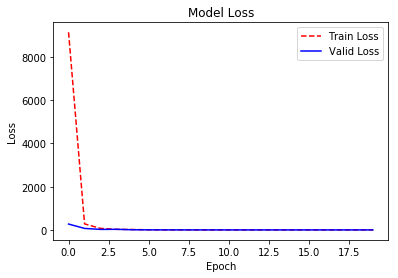

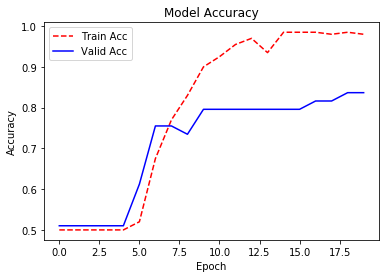

In [0]:
def plot_history(history):
    plt.plot(history.history['loss'],'r--')
    plt.plot(history.history['val_loss'],'b-')
    plt.title('Model Loss')
    plt.legend(['Train Loss', 'Valid Loss'])
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.show();
    plt.plot(history.history['accuracy'],'r--')
    plt.plot(history.history['val_accuracy'],'b-')
    plt.title('Model Accuracy')
    plt.legend(['Train Acc', 'Valid Acc'])
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.show()

# requires history=model.fit, fit_generator...
plot_history(history)

In [0]:
# compute final accuracy on training and test sets
y_pred = model.predict([tr_pairs[:, 0], tr_pairs[:, 1]])
tr_acc = compute_accuracy(tr_y, y_pred)
y_pred = model.predict([te_pairs[:, 0], te_pairs[:, 1]])
te_acc = compute_accuracy(te_y, y_pred)

print('* Accuracy on training set: %0.2f%%' % (100 * tr_acc))
print('* Accuracy on test set: %0.2f%%' % (100 * te_acc))

* Accuracy on training set: 98.50%
* Accuracy on test set: 83.67%


In [0]:
#base_network.save_weights("weights.best.siamese.20180408-2.hdf5")
#model.save_weights("weights.best.siamese.20180408-2.hdf5")

In [0]:
_, model = get_model() #weights="weights.best.siamese.20180408.hdf5")
model.load_weights("weights.best.siamese.20180408.hdf5")

In [0]:
true_clip = audio_data_dir + "data/librivox-zach/librivox-p.wav"
IPython.display.Audio(true_clip)

/home/zmccoy/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:958: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(magphase(D)[0]) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


(1, 20, 400)


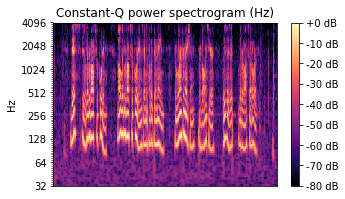

In [0]:
true_mfcc_batch = get_clip_batch(true_clip,display=True)
print(true_mfcc_batch.shape)

In [0]:
test_clip_1a = audio_data_dir + "data/post-test/ever-dance-jack-p.wav"
IPython.display.Audio(test_clip_1a)

/home/zmccoy/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:958: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(magphase(D)[0]) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


(1, 20, 400)


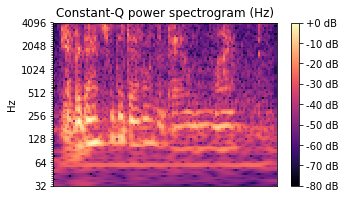

In [0]:
test_mfcc_batch_1a = get_clip_batch(test_clip_1a,display=True)
print(test_mfcc_batch_1a.shape)

[[ 2.62969232]]


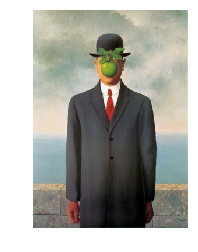

In [0]:
y_pred = model.predict([true_mfcc_batch, test_mfcc_batch_1a])
print(y_pred)
fun_classifier(classify(0,y_pred))

In [0]:
test_clip_1b = audio_data_dir + "data/post-test/ever-dance-zach-p.wav"
IPython.display.Audio(test_clip_1b)

/home/zmccoy/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:958: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(magphase(D)[0]) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


(1, 20, 400)


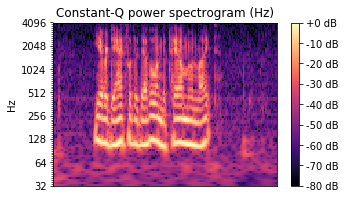

In [0]:
test_mfcc_batch_1b = get_clip_batch(test_clip_1b,display=True)
print(test_mfcc_batch_1b.shape)

[[ 0.00031623]]


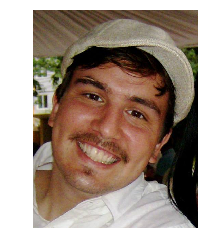

In [0]:
y_pred = model.predict([true_mfcc_batch, test_mfcc_batch_1b])
print(y_pred)
fun_classifier(classify(1,y_pred))

/home/zmccoy/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:958: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(magphase(D)[0]) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


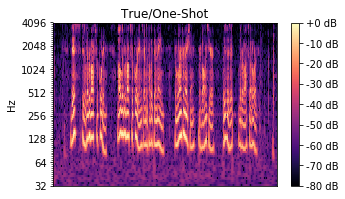

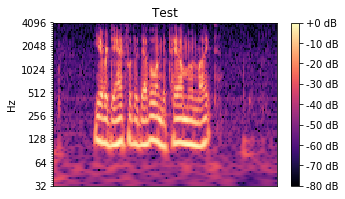

In [0]:
plot_comparison(true_clip, test_clip_1b)

In [0]:
def display_prediction(y_true, y_pred):
    print("---")
    print(y_pred)
    print("correct? " + str(is_correct(y_true,y_pred)))

def get_predictions(X_test, y_test, display=False):
    preds = np.zeros((0,1))
    for ii in range(len(y_test)):
        y_pred = model.predict([true_mfcc_batch, np.expand_dims(X_test[ii,:],axis=0)])
        preds = np.vstack((preds,classify(y_test[ii], y_pred)))
        if display is True:
            display_prediction(y_test[ii], y_pred)
    return preds.flatten()

In [0]:
X_zach, y_zach = get_clips(audio_data_dir + "data/zach",1)
print(X_zach.shape)
print(y_zach.shape)
print(y_zach)

(292, 20, 400)
(292,)
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [0]:
preds_zach = get_predictions(X_zach, y_zach)
print(preds_zach)
print(y_zach)

[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  0.  1.  1.  1.  1.  1.  1.  1.  1.  0.
  1.  1.  1.  1.  1.  0.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  0.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1

In [0]:
X_not_zach, y_not_zach = get_clips(audio_data_dir + "data/not-zach",0)
print(X_not_zach.shape)
print(y_not_zach.shape)
print(y_not_zach)

(249, 20, 400)
(249,)
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [0]:
preds_not_zach = get_predictions(X_not_zach, y_not_zach)
print(preds_not_zach)
print(y_not_zach)

[ 0.  1.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  1.  1.  0.  0.  0.  0.  0.  1.  1.  0.  1.  1.  0.  1.
  0.  0.  0.  0.  0.  1.  0.  1.  0.  0.  0.  0.  0.  1.  0.  1.  0.  0.
  1.  1.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  1.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.
  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  1.  0.
  0.  0.  0.  0.  1.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  1.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  1.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.
  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  1.
  0.  1.  0.  1.  0.  1.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  1.
  0.  0.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.
  1.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.
  0.  0.  0.  1.  1.  0.  0.  0.  0.  0.  0.  0.  1

In [0]:
import itertools
from sklearn.metrics import confusion_matrix

def print_statistics(cm):
    tn, fp, fn, tp = cm.ravel()
    # TP
    print("TP: " + str(tp))
    # TN
    print("TN: " + str(tn))
    # FP
    print("FP: " + str(fp))
    # FN
    print("FN: " + str(fn))
    # TPR
    recall = tp/(tp+fn)
    print("TPR/recall: " + str(recall))
    # TNR
    specificity = tn/(tn+fp)
    print("TNR/specificity: " + str(specificity))
    # PPV
    precision = tp/(tp+fp)
    print("PPV/precision: " + str(precision))
    # NPV
    npv = tn/(tn+fn)
    print("NPV/negative predictive value: " + str(npv))
    # FNR
    miss_rate = 1-recall
    print("FNR/false negative rate: " + str(miss_rate))
    # FPR
    fall_out = 1-specificity
    print("FPR/false positive rate: " + str(fall_out))
    # FDR
    fdr = 1-precision
    print("FDR/false discovery rate: " + str(fdr))
    # FOR
    fomr = 1-npv
    print("FOR/false ommission rate: " + str(fomr))
    # F1
    f1 = 2*((precision*recall)/(precision+recall))
    print("F1 score: " + str(f1))
    # accuracy
    acc = (tp+tn)/(tp+tn+fp+fn)
    print("Accuracy: " + str(acc))
    # Matthews correlation coefficient (MCC)
    mcc = (tp*tn-fp*fn)/math.sqrt((tp+fp)*(tp+fn)*(tn+fp)*(tn+fn))
    print("MCC/Matthews correlation coefficient: " + str(mcc))
    # Informedness or Bookmaker Informedness (BM)
    bm = recall+specificity-1
    print("BM/Bookmaker Informedness: " + str(bm))
    # Markedness (MK)
    mk = precision+npv-1
    print("MK/Markedness: " + str(mk))
    
    return fall_out, recall

# credit: https://github.com/scikit-learn/scikit-learn/blob/master/examples/model_selection/plot_confusion_matrix.py
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    #plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    s = [['TN','FP'], ['FN', 'TP']]
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(2):
        for j in range(2):
            plt.text(j,i, (str(s[i][j])+" = "+str(format(cm[i][j],fmt))),horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    
def get_confusion_matrix(trues, preds):
    cm = confusion_matrix(trues, preds)
    fpr, tpr = print_statistics(cm)
    plt.figure()
    plot_confusion_matrix(cm, classes=['Negative','Positive'], title='Confusion matrix')
    plt.show()

In [0]:
X_test = te_pairs[:,1,:]
y_test = te_y
preds_test = get_predictions(X_test, y_test)
print(preds_test)
print(y_test)

[ 0.  1.  0.  1.  0.  1.  0.  1.  0.  1.  1.  1.  0.  1.  0.  1.  0.  1.
  0.  1.  0.  1.  0.  1.  0.  1.  0.  1.  0.  1.  1.  1.  0.  1.  0.  1.
  0.  1.  0.  1.  0.  1.  0.  1.  0.  1.  0.  1.  0.]
[0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0 1 0
 1 0 1 0 1 0 1 0 1 0 1 0]


TP: 24
TN: 23
FP: 2
FN: 0
TPR/recall: 1.0
TNR/specificity: 0.92
PPV/precision: 0.923076923077
NPV/negative predictive value: 1.0
FNR/false negative rate: 0.0
FPR/false positive rate: 0.08
FDR/false discovery rate: 0.0769230769231
FOR/false ommission rate: 0.0
F1 score: 0.96
Accuracy: 0.959183673469
MCC/Matthews correlation coefficient: 0.921537177346
BM/Bookmaker Informedness: 0.92
MK/Markedness: 0.923076923077


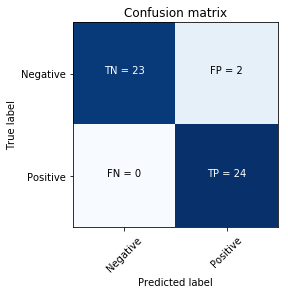

In [0]:
get_confusion_matrix(y_test, preds_test)

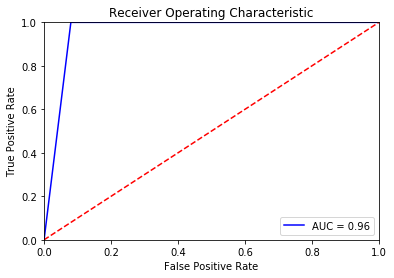

In [0]:
from sklearn.metrics import roc_curve, auc
fpr, tpr, threshold = roc_curve(y_test, preds_test)
roc_auc = auc(fpr,tpr)

# credit: https://stackoverflow.com/questions/25009284/how-to-plot-roc-curve-in-python
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

#### NEXT STEPS ####

- Compare results w/ K-Nearest Neighbor, other ML models
- MOAR DATA! Scrape, augment, Amazon Turk...
- w/ background tracks, whitenoise, multiple speakers/voices, multiple languages

### LIVE DEMO!!! ###

In [0]:
test_clip_2a = audio_data_dir + "data/live-demo/rich.wav" #rich-accent.wav"
IPython.display.Audio(test_clip_2a)

/home/zmccoy/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:958: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(magphase(D)[0]) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


(1, 20, 400)


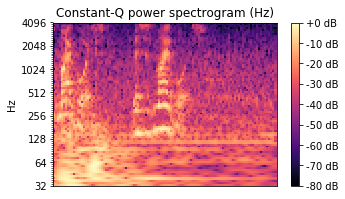

In [0]:
test_mfcc_batch_2a = get_clip_batch(test_clip_2a,display=True)
print(test_mfcc_batch_2a.shape)

[[ 0.60657334]]


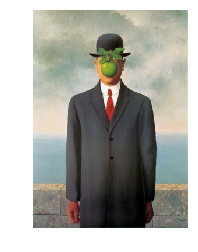

In [0]:
y_pred = model.predict([true_mfcc_batch, test_mfcc_batch_2a])
print(y_pred)
fun_classifier(classify(0,y_pred))

In [0]:
test_clip_2b = audio_data_dir + "data/live-demo/zach.wav"
IPython.display.Audio(test_clip_2b)

/home/zmccoy/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:958: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(magphase(D)[0]) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


(1, 20, 400)


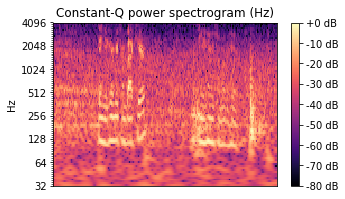

In [0]:
test_mfcc_batch_2b = get_clip_batch(test_clip_2b,display=True)
print(test_mfcc_batch_2b.shape)

[[ 0.00031623]]


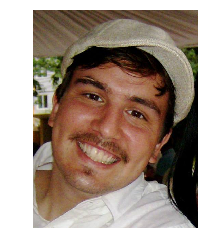

In [0]:
y_pred = model.predict([true_mfcc_batch, test_mfcc_batch_2b])
print(y_pred)
fun_classifier(classify(1,y_pred))